# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [3]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

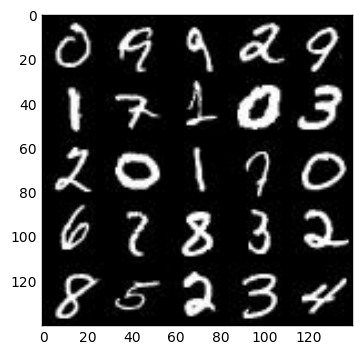

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

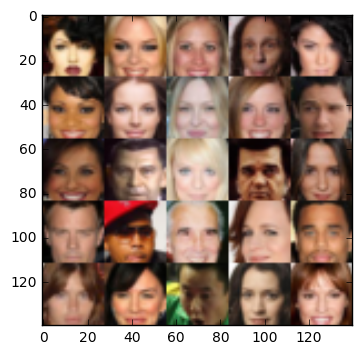

In [5]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [6]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [7]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, None, name="lr")

    return input_real, input_z, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [48]:
alpha = 0.1
keep_prob = 0.8

def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28xchannels
        x1 = tf.layers.conv2d(images, 60, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        relu1 = tf.nn.dropout(relu1, keep_prob=keep_prob)
        # 16x16x60
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        relu2 = tf.nn.dropout(relu2, keep_prob=keep_prob)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 4, strides=1, padding='valid')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        relu3 = tf.nn.dropout(relu3, keep_prob=keep_prob)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [49]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        x1 = tf.nn.dropout(x1, keep_prob=keep_prob)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        x2 = tf.nn.dropout(x2, keep_prob=keep_prob)
        # 7x7x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        x3 = tf.nn.dropout(x3, keep_prob=keep_prob)
        # 14x14x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now

        out = tf.tanh(logits)
        
        return out    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [50]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smoothness = 0.1
    g_output = generator(input_z, out_channel_dim)
    disc_output_real, disc_logits_real = discriminator(input_real)
    disc_output_fake, disc_logits_fake = discriminator(g_output, reuse=True)
    
    disc_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = disc_logits_real,
            labels = tf.ones_like(disc_output_real) * (1 - smoothness)
        )
    )
    disc_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = disc_logits_fake,
            labels = tf.zeros_like(disc_output_fake)
        )
    )
    gen_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = disc_logits_fake,
            labels = tf.ones_like(disc_output_fake)
        )
    )
    
    disc_loss = disc_loss_real + disc_loss_fake
    return disc_loss, gen_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [51]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function

    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [52]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [53]:
import sys

def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    # Create tensor structure
    width, length, channels = data_shape[1], data_shape[2], data_shape[3]
    print("Preparing model...")
    input_real, input_z, lr = model_inputs(width, length, channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, channels)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    num_of_batches = int(data_shape[0] / batch_size)

    # TODO: Build Model
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            print("Epoch: ", epoch_i+1)
            
            seq = 0
            for batch_images in get_batches(batch_size):
                seq += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                # Resize images ( -1 to 1)
                batch_images = batch_images * 2
                
                if seq == 1 and epoch_i == 0:
                    print('Starting with:')
                    show_generator_output(sess, 16, input_z, data_shape[3], data_image_mode)

                sys.stdout.write(".")                    
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})                

                ### Show current state
                if show_interval > 0 and ((seq % show_interval) == 0 or seq == num_of_batches):
                    print('\nEpoch {} - Batch: {} '.format(epoch_i+1, seq))
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    # Make sure the loss of the generator is 
                    constraint_1 = train_loss_g < train_loss_d # lower than the loss of the discriminator
                    constraint_2 = train_loss_g < 1            # close to 0
                    final_status = constraint_1 or constraint_2

                    print("Generator Loss: {:.4f}".format(train_loss_g),
                          "\tDiscriminator Loss: {:.4f}...".format(train_loss_d))
                    if not constraint_1:
                        print("** Generator's loss bigger than Discriminator's **")
                    if not constraint_2:
                        print("** Generator's loss should be near zero **")
                    is_ok = ""
                    if not final_status:
                        is_ok = "not "
                    print("Generator is {}good enough".format(is_ok))
                    show_generator_output(sess, 20, input_z, data_shape[3], data_image_mode)


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Preparing model...
Epoch:  1
Starting with:


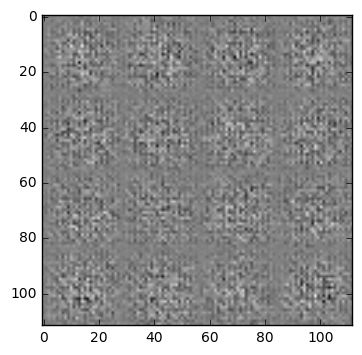

....................................................................................................
Epoch 1 - Batch: 100 
Generator Loss: 8.0238 	Discriminator Loss: 1.9814...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


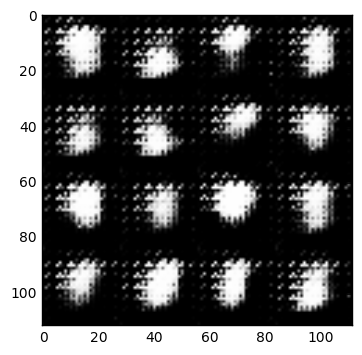

....................................................................................................
Epoch 1 - Batch: 200 
Generator Loss: 1.8980 	Discriminator Loss: 0.7225...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


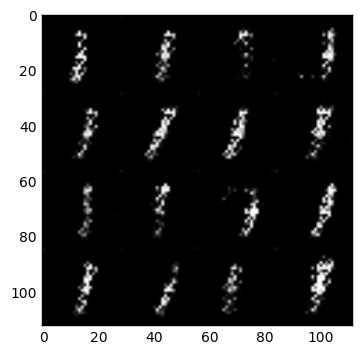

....................................................................................................
Epoch 1 - Batch: 300 
Generator Loss: 2.8873 	Discriminator Loss: 1.1024...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


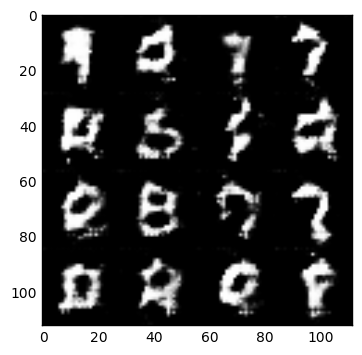

....................................................................................................
Epoch 1 - Batch: 400 
Generator Loss: 1.0971 	Discriminator Loss: 1.1817...
** Generator's loss should be near zero **
Generator is good enough


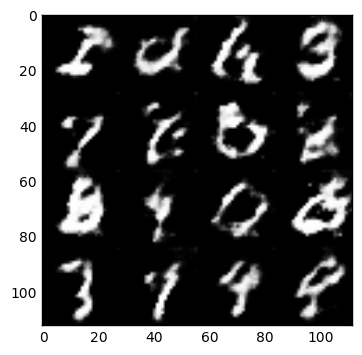

....................................................................................................
Epoch 1 - Batch: 500 
Generator Loss: 0.5953 	Discriminator Loss: 1.4946...
Generator is good enough


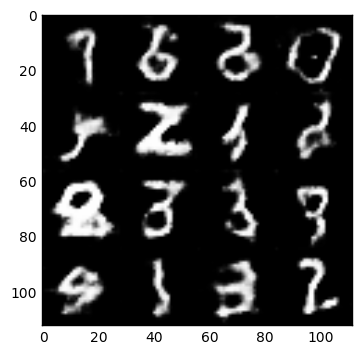

....................................................................................................
Epoch 1 - Batch: 600 
Generator Loss: 1.0289 	Discriminator Loss: 1.1536...
** Generator's loss should be near zero **
Generator is good enough


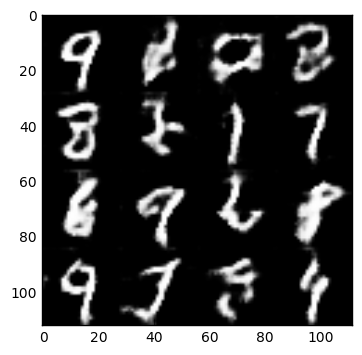

....................................................................................................
Epoch 1 - Batch: 700 
Generator Loss: 1.4050 	Discriminator Loss: 1.0404...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


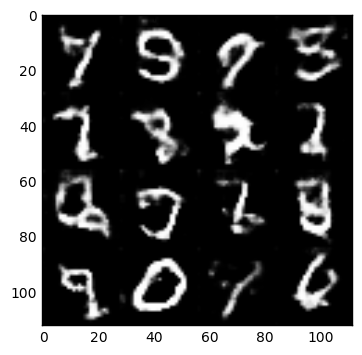

....................................................................................................
Epoch 1 - Batch: 800 
Generator Loss: 1.0204 	Discriminator Loss: 1.1315...
** Generator's loss should be near zero **
Generator is good enough


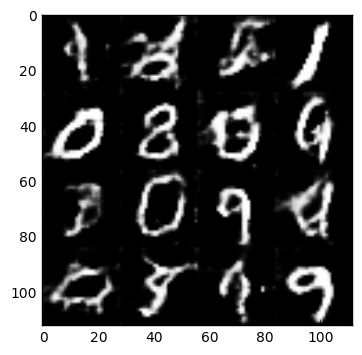

....................................................................................................
Epoch 1 - Batch: 900 
Generator Loss: 1.3290 	Discriminator Loss: 1.0486...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


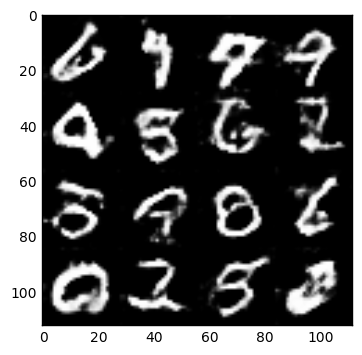

.....................................
Epoch 1 - Batch: 937 
Generator Loss: 1.0020 	Discriminator Loss: 1.1316...
** Generator's loss should be near zero **
Generator is good enough


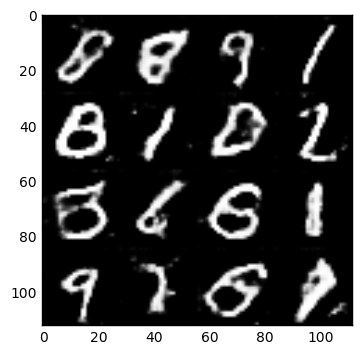

Epoch:  2
....................................................................................................
Epoch 2 - Batch: 100 
Generator Loss: 0.9925 	Discriminator Loss: 1.0463...
Generator is good enough


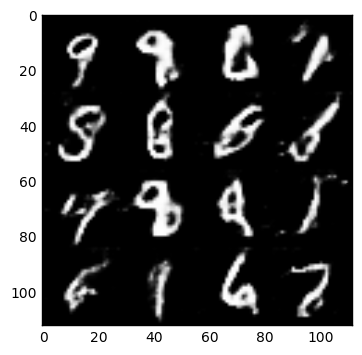

....................................................................................................
Epoch 2 - Batch: 200 
Generator Loss: 1.1876 	Discriminator Loss: 0.9964...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


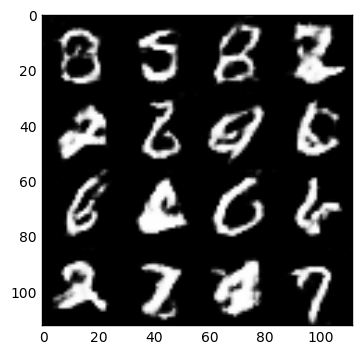

....................................................................................................
Epoch 2 - Batch: 300 
Generator Loss: 2.0524 	Discriminator Loss: 0.7982...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


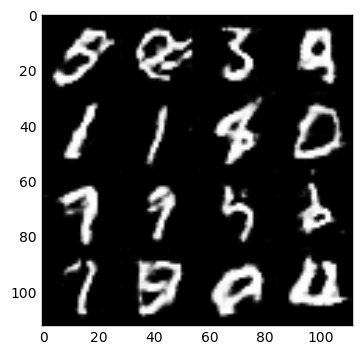

....................................................................................................
Epoch 2 - Batch: 400 
Generator Loss: 1.1956 	Discriminator Loss: 0.9817...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


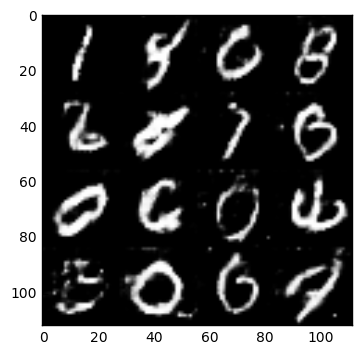

....................................................................................................
Epoch 2 - Batch: 500 
Generator Loss: 0.8195 	Discriminator Loss: 1.1150...
Generator is good enough


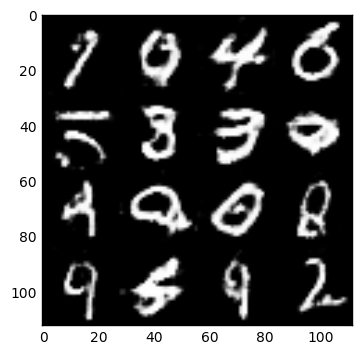

....................................................................................................
Epoch 2 - Batch: 600 
Generator Loss: 0.9394 	Discriminator Loss: 1.2151...
Generator is good enough


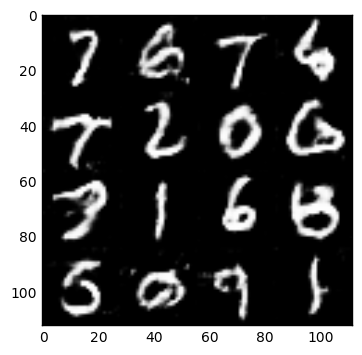

....................................................................................................
Epoch 2 - Batch: 700 
Generator Loss: 1.6987 	Discriminator Loss: 0.7867...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


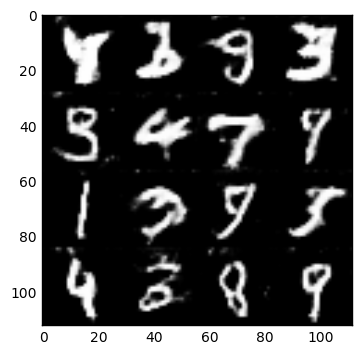

....................................................................................................
Epoch 2 - Batch: 800 
Generator Loss: 1.3597 	Discriminator Loss: 1.0002...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


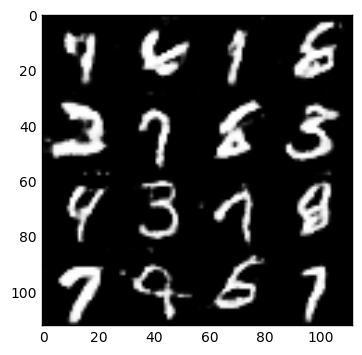

....................................................................................................
Epoch 2 - Batch: 900 
Generator Loss: 0.7365 	Discriminator Loss: 1.3625...
Generator is good enough


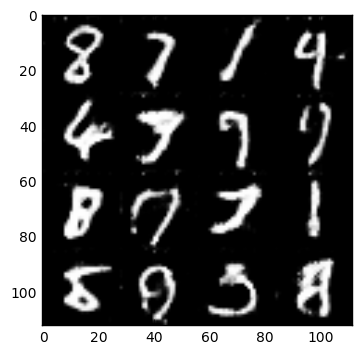

.....................................
Epoch 2 - Batch: 937 
Generator Loss: 1.3704 	Discriminator Loss: 0.9862...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


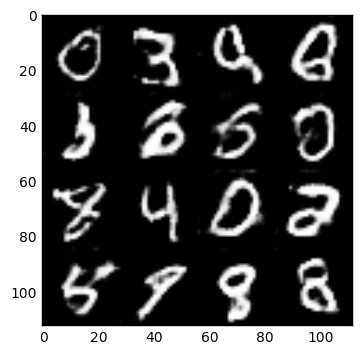

Done!


In [54]:
batch_size = 64
z_dim = 256
learning_rate = 0.003
beta1 = 0.5
show_interval = 100

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)
    
print("Done!")

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Preparing model...
Epoch:  1
Starting with:


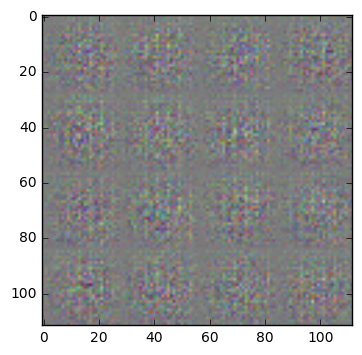

....................................................................................................
Epoch 1 - Batch: 100 
Generator Loss: 8.1272 	Discriminator Loss: 1.9731...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


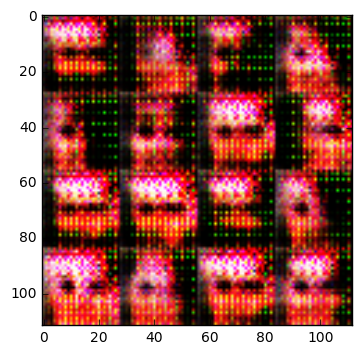

....................................................................................................
Epoch 1 - Batch: 200 
Generator Loss: 2.3663 	Discriminator Loss: 1.0314...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


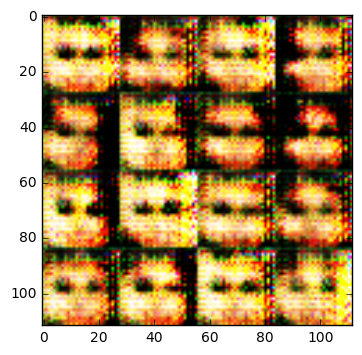

....................................................................................................
Epoch 1 - Batch: 300 
Generator Loss: 0.7925 	Discriminator Loss: 1.3720...
Generator is good enough


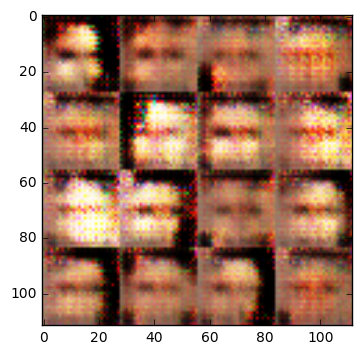

....................................................................................................
Epoch 1 - Batch: 400 
Generator Loss: 1.6565 	Discriminator Loss: 1.0269...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


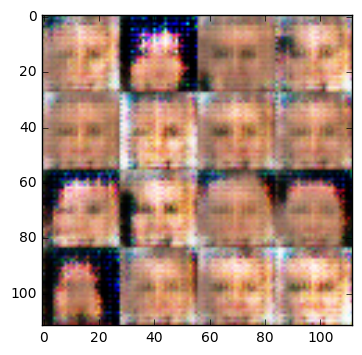

....................................................................................................
Epoch 1 - Batch: 500 
Generator Loss: 1.4239 	Discriminator Loss: 1.6384...
** Generator's loss should be near zero **
Generator is good enough


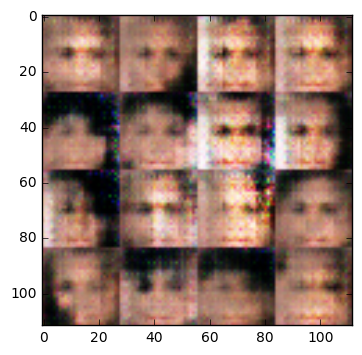

....................................................................................................
Epoch 1 - Batch: 600 
Generator Loss: 0.7776 	Discriminator Loss: 1.2720...
Generator is good enough


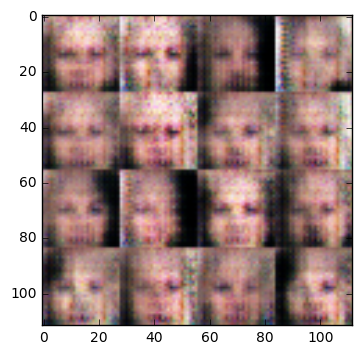

....................................................................................................
Epoch 1 - Batch: 700 
Generator Loss: 1.8316 	Discriminator Loss: 0.8376...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


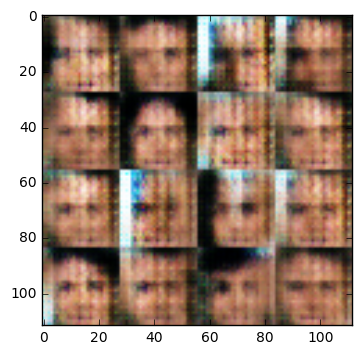

....................................................................................................
Epoch 1 - Batch: 800 
Generator Loss: 1.0934 	Discriminator Loss: 0.8458...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


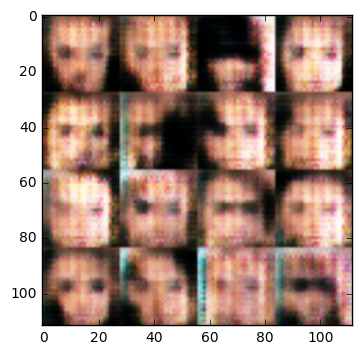

....................................................................................................
Epoch 1 - Batch: 900 
Generator Loss: 0.6634 	Discriminator Loss: 1.4652...
Generator is good enough


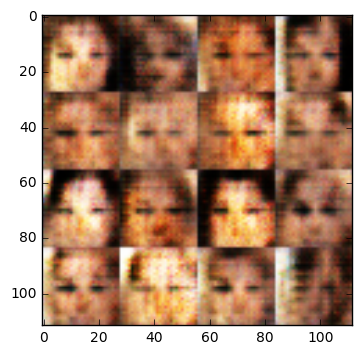

....................................................................................................
Epoch 1 - Batch: 1000 
Generator Loss: 1.3217 	Discriminator Loss: 1.3688...
** Generator's loss should be near zero **
Generator is good enough


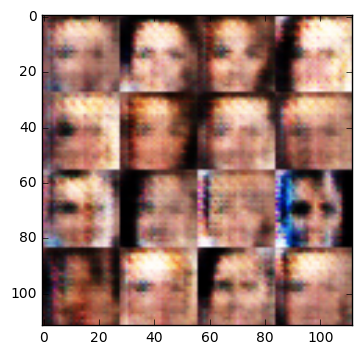

....................................................................................................
Epoch 1 - Batch: 1100 
Generator Loss: 1.3278 	Discriminator Loss: 0.8618...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


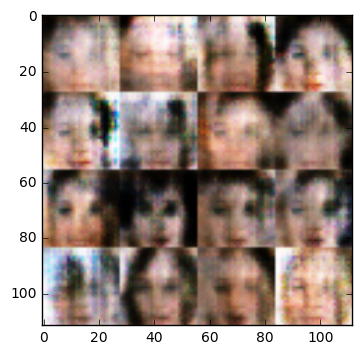

....................................................................................................
Epoch 1 - Batch: 1200 
Generator Loss: 1.3788 	Discriminator Loss: 0.9071...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


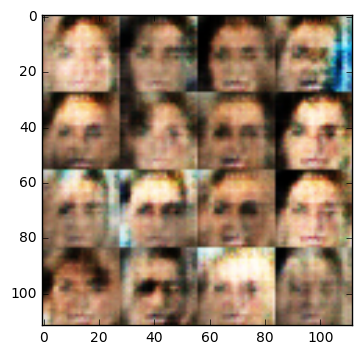

....................................................................................................
Epoch 1 - Batch: 1300 
Generator Loss: 1.0406 	Discriminator Loss: 1.1113...
** Generator's loss should be near zero **
Generator is good enough


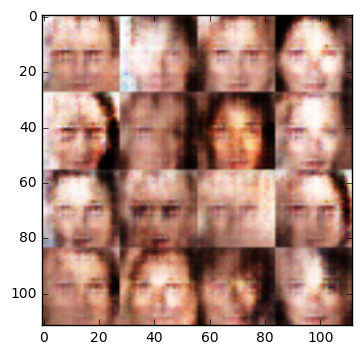

....................................................................................................
Epoch 1 - Batch: 1400 
Generator Loss: 1.3601 	Discriminator Loss: 0.9212...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


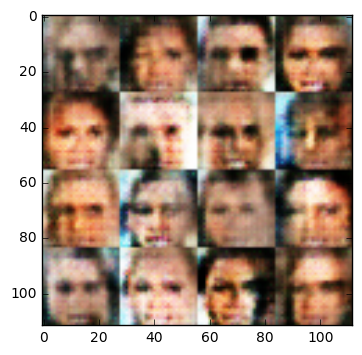

....................................................................................................
Epoch 1 - Batch: 1500 
Generator Loss: 1.3014 	Discriminator Loss: 0.8680...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


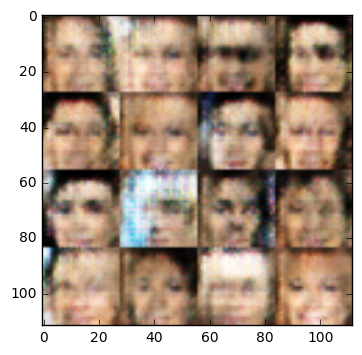

....................................................................................................
Epoch 1 - Batch: 1600 
Generator Loss: 1.4933 	Discriminator Loss: 0.9256...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


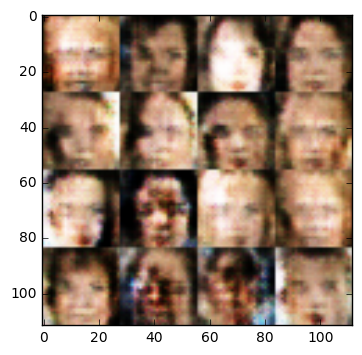

....................................................................................................
Epoch 1 - Batch: 1700 
Generator Loss: 1.4203 	Discriminator Loss: 0.9650...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


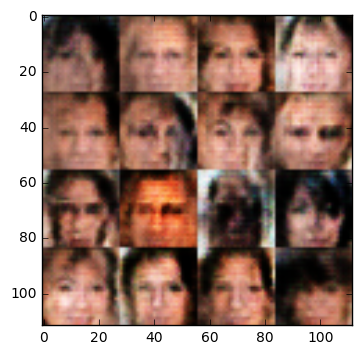

....................................................................................................
Epoch 1 - Batch: 1800 
Generator Loss: 1.3813 	Discriminator Loss: 0.8969...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


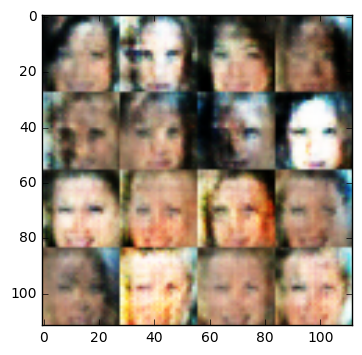

....................................................................................................
Epoch 1 - Batch: 1900 
Generator Loss: 0.6802 	Discriminator Loss: 1.4782...
Generator is good enough


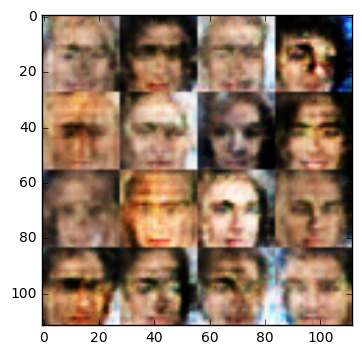

....................................................................................................
Epoch 1 - Batch: 2000 
Generator Loss: 0.9515 	Discriminator Loss: 1.0211...
Generator is good enough


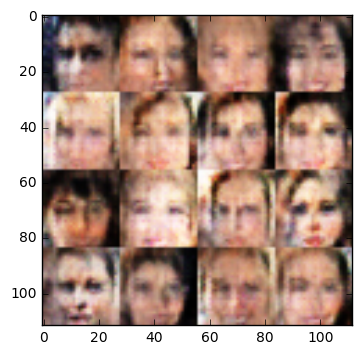

....................................................................................................
Epoch 1 - Batch: 2100 
Generator Loss: 1.1001 	Discriminator Loss: 1.0122...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


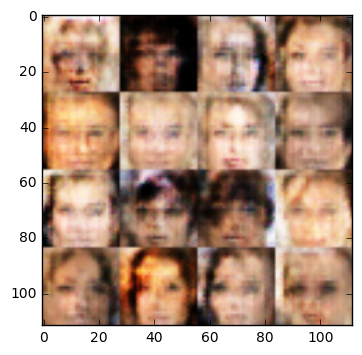

....................................................................................................
Epoch 1 - Batch: 2200 
Generator Loss: 0.9068 	Discriminator Loss: 1.1145...
Generator is good enough


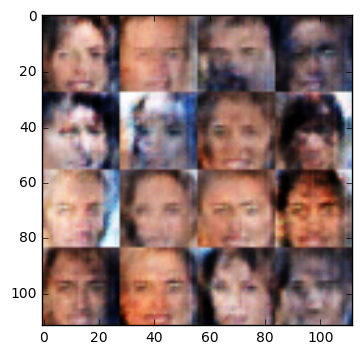

....................................................................................................
Epoch 1 - Batch: 2300 
Generator Loss: 1.3956 	Discriminator Loss: 0.9727...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


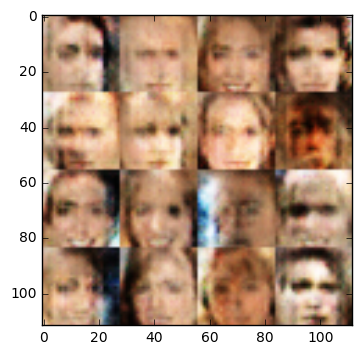

....................................................................................................
Epoch 1 - Batch: 2400 
Generator Loss: 0.9635 	Discriminator Loss: 0.9170...
** Generator's loss bigger than Discriminator's **
Generator is good enough


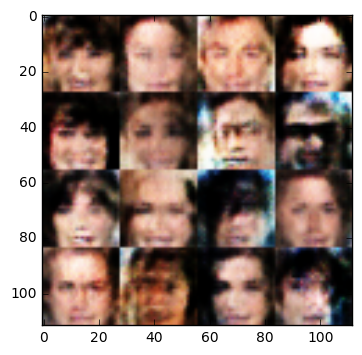

....................................................................................................
Epoch 1 - Batch: 2500 
Generator Loss: 1.5582 	Discriminator Loss: 1.0564...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


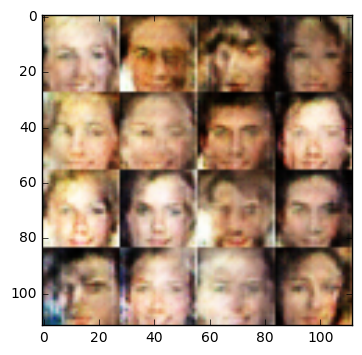

....................................................................................................
Epoch 1 - Batch: 2600 
Generator Loss: 0.8568 	Discriminator Loss: 1.1355...
Generator is good enough


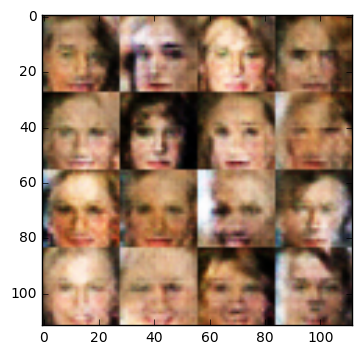

....................................................................................................
Epoch 1 - Batch: 2700 
Generator Loss: 0.6712 	Discriminator Loss: 1.3715...
Generator is good enough


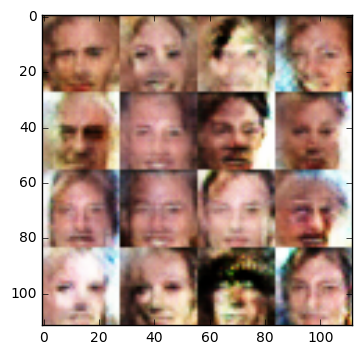

....................................................................................................
Epoch 1 - Batch: 2800 
Generator Loss: 1.4409 	Discriminator Loss: 1.2096...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


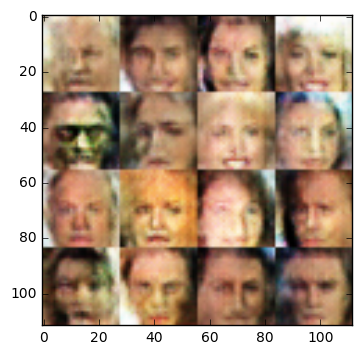

....................................................................................................
Epoch 1 - Batch: 2900 
Generator Loss: 1.1961 	Discriminator Loss: 1.0577...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


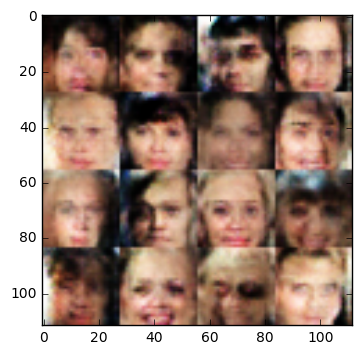

....................................................................................................
Epoch 1 - Batch: 3000 
Generator Loss: 0.8501 	Discriminator Loss: 1.1419...
Generator is good enough


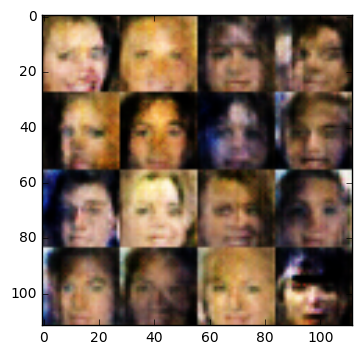

....................................................................................................
Epoch 1 - Batch: 3100 
Generator Loss: 1.0441 	Discriminator Loss: 1.1484...
** Generator's loss should be near zero **
Generator is good enough


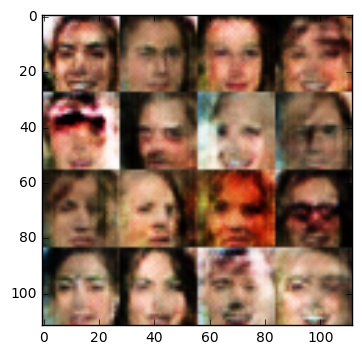

....................................................................................................
Epoch 1 - Batch: 3200 
Generator Loss: 0.8743 	Discriminator Loss: 1.3342...
Generator is good enough


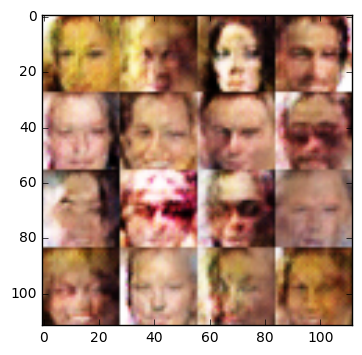

....................................................................................................
Epoch 1 - Batch: 3300 
Generator Loss: 1.2447 	Discriminator Loss: 0.8803...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


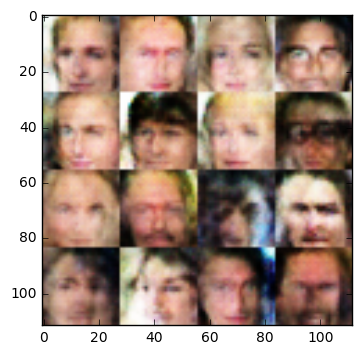

....................................................................................................
Epoch 1 - Batch: 3400 
Generator Loss: 1.1872 	Discriminator Loss: 1.0566...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


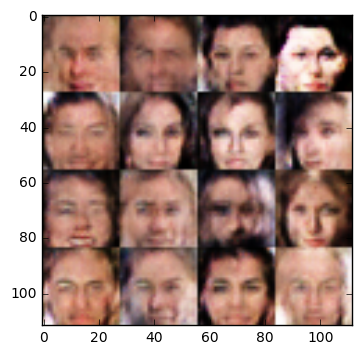

....................................................................................................
Epoch 1 - Batch: 3500 
Generator Loss: 0.8412 	Discriminator Loss: 1.4716...
Generator is good enough


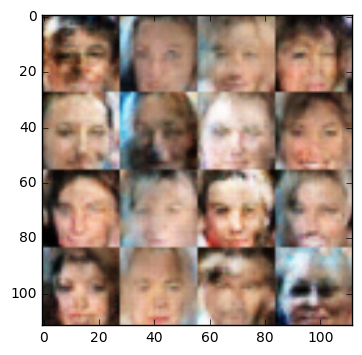

....................................................................................................
Epoch 1 - Batch: 3600 
Generator Loss: 0.9360 	Discriminator Loss: 1.1074...
Generator is good enough


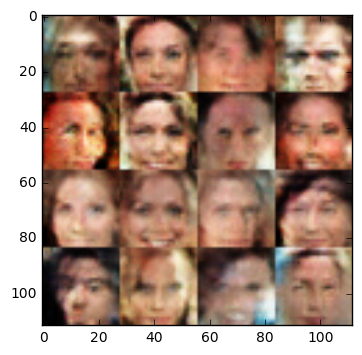

....................................................................................................
Epoch 1 - Batch: 3700 
Generator Loss: 0.7579 	Discriminator Loss: 1.3776...
Generator is good enough


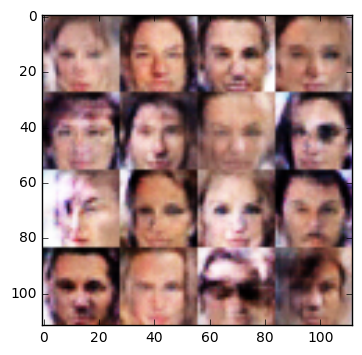

....................................................................................................
Epoch 1 - Batch: 3800 
Generator Loss: 1.2717 	Discriminator Loss: 1.0623...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


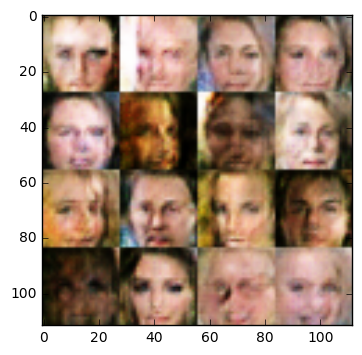

....................................................................................................
Epoch 1 - Batch: 3900 
Generator Loss: 1.1404 	Discriminator Loss: 1.1070...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


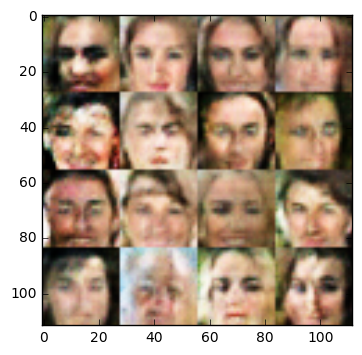

....................................................................................................
Epoch 1 - Batch: 4000 
Generator Loss: 1.2360 	Discriminator Loss: 0.8970...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


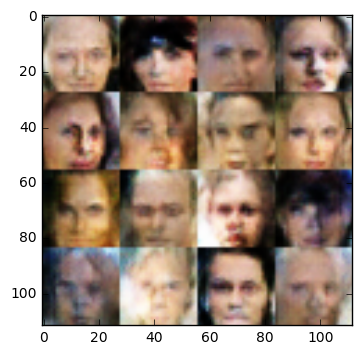

....................................................................................................
Epoch 1 - Batch: 4100 
Generator Loss: 1.2909 	Discriminator Loss: 1.0385...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


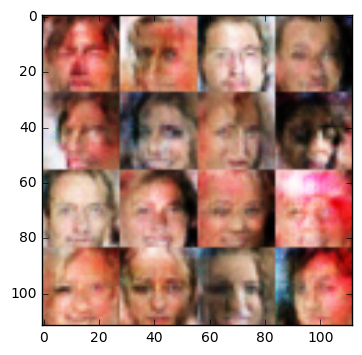

....................................................................................................
Epoch 1 - Batch: 4200 
Generator Loss: 1.5521 	Discriminator Loss: 1.3077...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


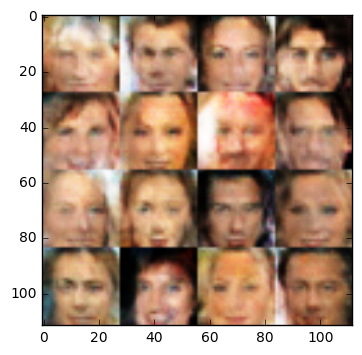

....................................................................................................
Epoch 1 - Batch: 4300 
Generator Loss: 1.3942 	Discriminator Loss: 0.8821...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


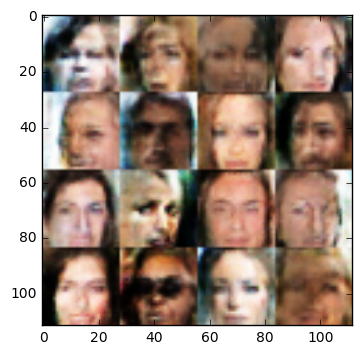

....................................................................................................
Epoch 1 - Batch: 4400 
Generator Loss: 1.1892 	Discriminator Loss: 1.2123...
** Generator's loss should be near zero **
Generator is good enough


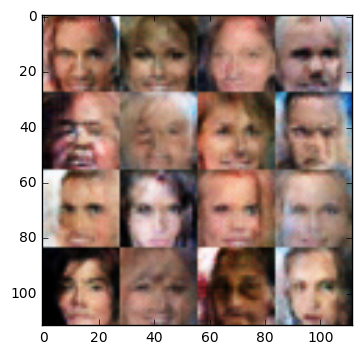

....................................................................................................
Epoch 1 - Batch: 4500 
Generator Loss: 1.4131 	Discriminator Loss: 0.9715...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


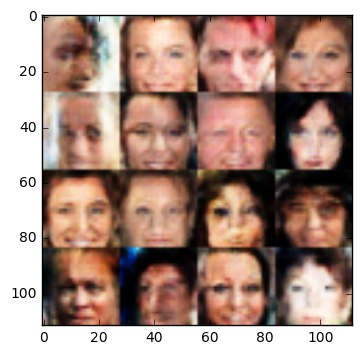

....................................................................................................
Epoch 1 - Batch: 4600 
Generator Loss: 1.0229 	Discriminator Loss: 1.1454...
** Generator's loss should be near zero **
Generator is good enough


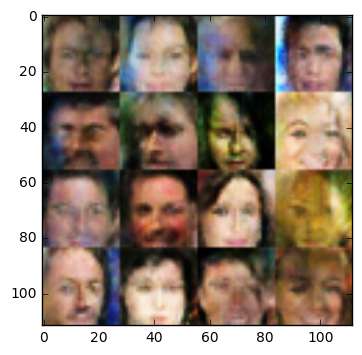

....................................................................................................
Epoch 1 - Batch: 4700 
Generator Loss: 1.1546 	Discriminator Loss: 1.0156...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


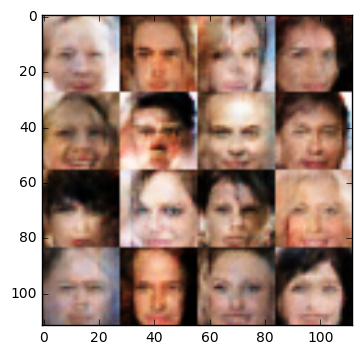

....................................................................................................
Epoch 1 - Batch: 4800 
Generator Loss: 1.2401 	Discriminator Loss: 1.0395...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


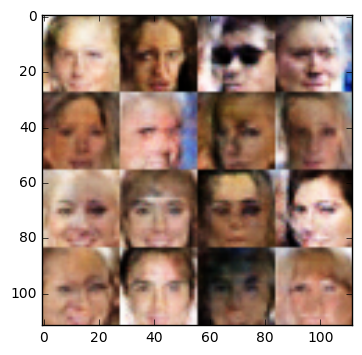

....................................................................................................
Epoch 1 - Batch: 4900 
Generator Loss: 0.9635 	Discriminator Loss: 0.9690...
Generator is good enough


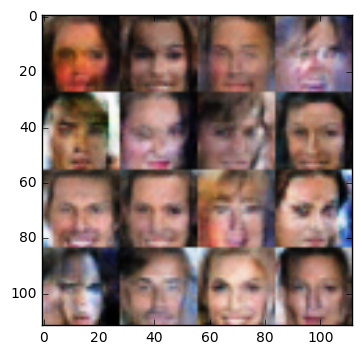

....................................................................................................
Epoch 1 - Batch: 5000 
Generator Loss: 1.3097 	Discriminator Loss: 0.9830...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


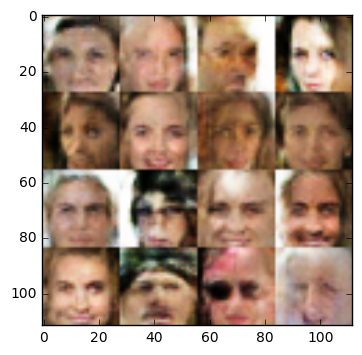

....................................................................................................
Epoch 1 - Batch: 5100 
Generator Loss: 0.9162 	Discriminator Loss: 1.1194...
Generator is good enough


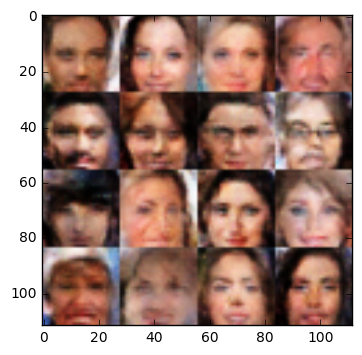

....................................................................................................
Epoch 1 - Batch: 5200 
Generator Loss: 1.9762 	Discriminator Loss: 0.8949...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


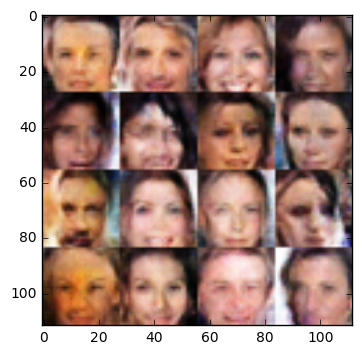

....................................................................................................
Epoch 1 - Batch: 5300 
Generator Loss: 0.7590 	Discriminator Loss: 1.3897...
Generator is good enough


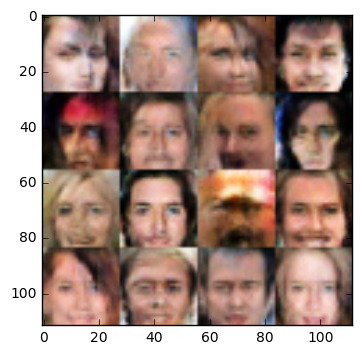

....................................................................................................
Epoch 1 - Batch: 5400 
Generator Loss: 0.5872 	Discriminator Loss: 1.4459...
Generator is good enough


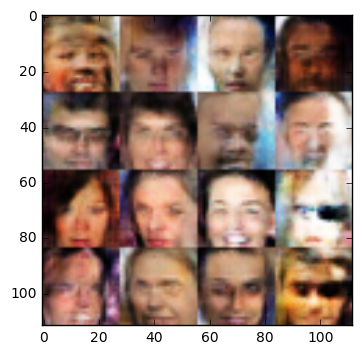

....................................................................................................
Epoch 1 - Batch: 5500 
Generator Loss: 0.9914 	Discriminator Loss: 1.1395...
Generator is good enough


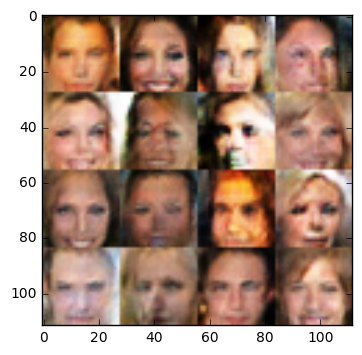

....................................................................................................
Epoch 1 - Batch: 5600 
Generator Loss: 1.2480 	Discriminator Loss: 0.8982...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


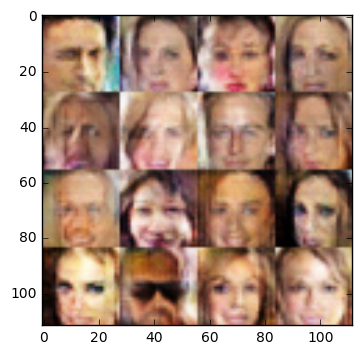

....................................................................................................
Epoch 1 - Batch: 5700 
Generator Loss: 0.9031 	Discriminator Loss: 1.2565...
Generator is good enough


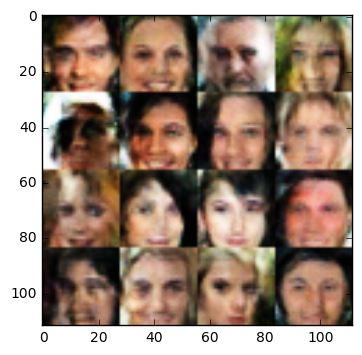

....................................................................................................
Epoch 1 - Batch: 5800 
Generator Loss: 1.2132 	Discriminator Loss: 1.1066...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


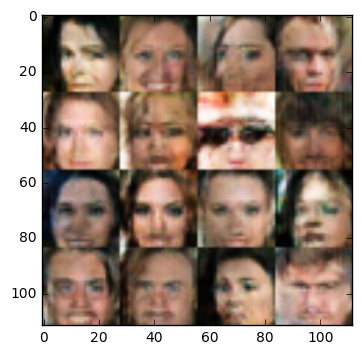

....................................................................................................
Epoch 1 - Batch: 5900 
Generator Loss: 1.3733 	Discriminator Loss: 0.9704...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


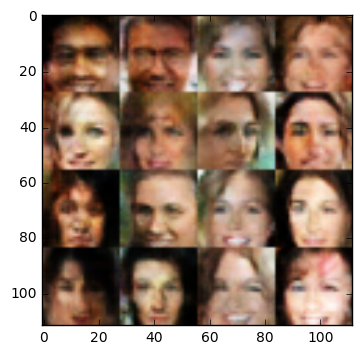

....................................................................................................
Epoch 1 - Batch: 6000 
Generator Loss: 0.6767 	Discriminator Loss: 1.2625...
Generator is good enough


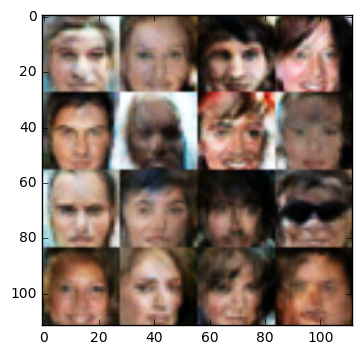

....................................................................................................
Epoch 1 - Batch: 6100 
Generator Loss: 1.0066 	Discriminator Loss: 1.1360...
** Generator's loss should be near zero **
Generator is good enough


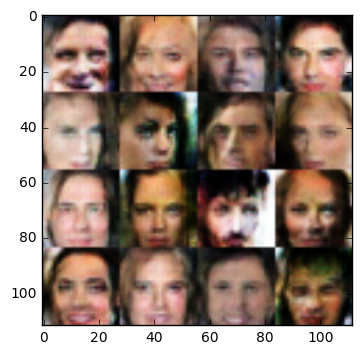

....................................................................................................
Epoch 1 - Batch: 6200 
Generator Loss: 1.4786 	Discriminator Loss: 0.7852...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


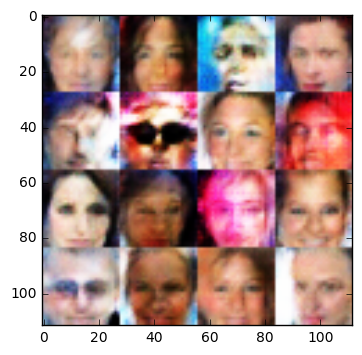

....................................................................................................
Epoch 1 - Batch: 6300 
Generator Loss: 1.1118 	Discriminator Loss: 0.9009...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


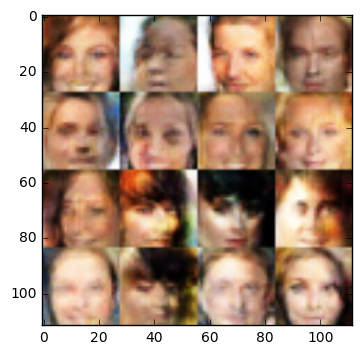

...............................
Epoch 1 - Batch: 6331 
Generator Loss: 1.5364 	Discriminator Loss: 0.9847...
** Generator's loss bigger than Discriminator's **
** Generator's loss should be near zero **
Generator is not good enough


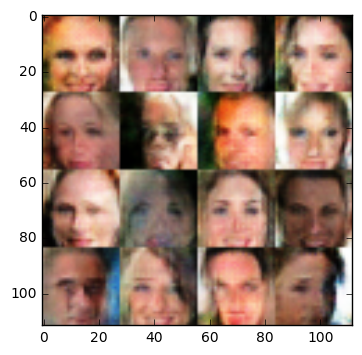

In [56]:
batch_size = 32
# z_dim = 256
# learning_rate = 0.005
# beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.